# BNB: Metadata and Gene Expression of Cells Selected by Region Sketch
Data is obtained from 10X Genomics

In [25]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: ANYWIDGET_HMR=1


In [26]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
from celldega.pre import _to_geometry
import geopandas as gpd
from shapely.geometry import Point
from celldega.pre.boundary_tile import batch_transform_geometries, _get_name_mapping
from celldega.pre import _to_geometry

# Data initialization

In [27]:
dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
use_int_index = True

tech = 'Xenium'

DATA_DIR = f'../data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'landscape_files/{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [28]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_pixel.parquet')
display(gdf_pixel)

gdf_micron = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')
display(gdf_micron)


,area,roi,color,geometry
0,4.021754e+06,region_1,"[22.288097511684157, 152.96716050175397, 162.2...","POLYGON ((6982.182 7628.474, 7736.994 7319.100..."


,area,roi,color,geometry
0,181607.372902,region_1,"[22.288097511684157, 152.96716050175397, 162.2...","POLYGON ((1483.714 1621.051, 1644.111 1555.309..."


## Transform points from pixel space to micron space

In [29]:
cell_meta = pd.read_parquet(f"{path_landscape_files}/cell_metadata.parquet")
cell_meta["geometry"] = cell_meta["geometry"].apply(lambda coords: Point(coords[0], coords[1]))
cell_meta_gdf = gpd.GeoDataFrame(cell_meta, geometry="geometry", crs="EPSG:4326")

gdf_join = gdf_pixel.sjoin(cell_meta_gdf, how='right', predicate='intersects').drop(columns=['index_left'], errors='ignore')
df_cluster = pd.read_parquet(f"{path_landscape_files}/cell_clusters/cluster.parquet")
gdf_join['cluster'] = gdf_join['name'].map(df_cluster['cluster'])



if use_int_index: # For older version landscapes files, set use_int_index to False
    # Convert string index to integer index
    cell_str_to_int_mapping = _get_name_mapping(
        path_landscape_files,
        layer='boundary',
        )
    gdf_join['name'] = gdf_join['name'].map(cell_str_to_int_mapping)

gene_list = ['TP53', 'MUC16']
if dataset_name == 'Xenium_V1_human_Pancreas_FFPE_outs':
    gene_list = ['EPCAM']

for gene in gene_list:
    df_gene = pd.read_parquet(f"{path_landscape_files}/cbg/{gene}.parquet")
    df_gene['name'] = df_gene.index
    gdf_join = pd.merge(gdf_join, df_gene, on='name', how='left')
    
gdf_join.head()

/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


,area,roi,color,name,geometry,cluster,EPCAM
0,NaN,NaN,NaN,0,POINT (2100.36000 8006.39000),15,2.0
1,NaN,NaN,NaN,1,POINT (2076.74000 8168.84000),9,9.0
2,NaN,NaN,NaN,2,POINT (2193.19000 8057.69000),15,5.0
3,NaN,NaN,NaN,3,POINT (2027.57000 8035.13000),13,1.0
4,NaN,NaN,NaN,4,POINT (2240.52000 8052.18000),18,6.0


In [30]:
path_transformation_matrix = f'{path_landscape_files}/micron_to_image_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)
gdf_join_micron = gdf_join.copy()
gdf_join_micron["geometry"] = batch_transform_geometries(gdf_join_micron["geometry"], inverse_matrix, 1)
gdf_join_micron['geometry'] = gdf_join_micron['geometry'].apply(_to_geometry)

## Cluster of region selected cells

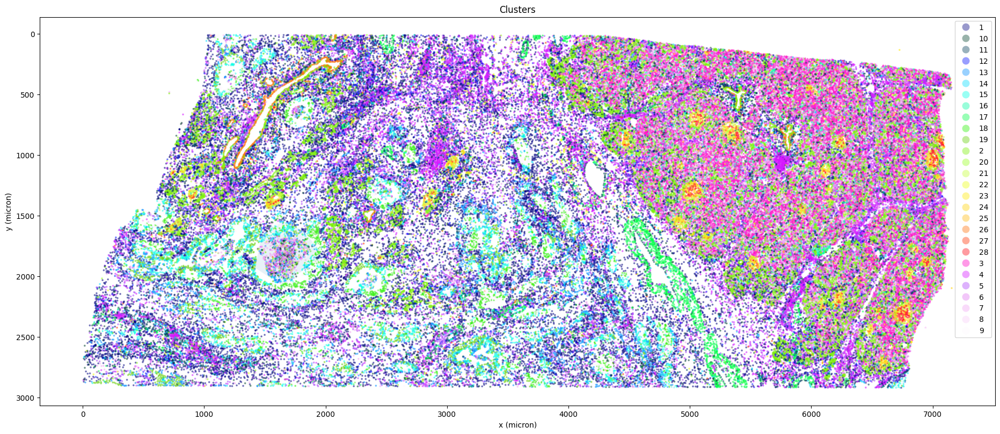

In [31]:

fig, ax = plt.subplots(figsize=(20,8))

# Plot the base layer (ROI)
gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.1)

gdf_join_micron.plot(
    ax=ax,
    column='cluster',
    aspect=1,
    legend=True,
    alpha=0.4,
    cmap='gist_ncar',
    markersize=3,
)

# Adjust the plot
ax.invert_yaxis()
plt.title("Clusters")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
plt.show()


## Gene expression of region selected cells

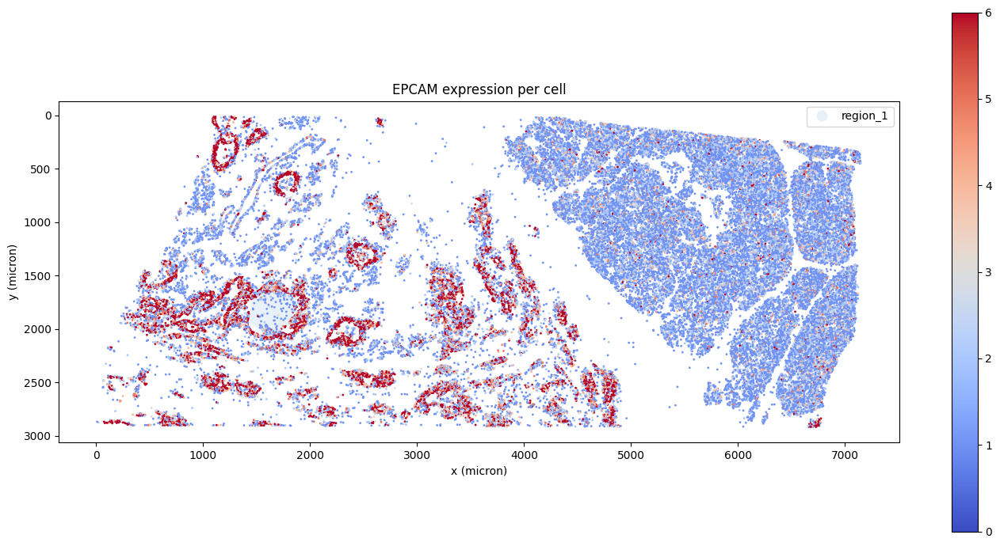

In [32]:
for gene in gene_list:

    fig, ax = plt.subplots(figsize=(14, 7))
    gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.1)
    gdf_join_micron.plot(ax=ax, aspect=1, column=gene, legend=True, vmin=0, vmax=6, cmap='coolwarm', s=1)

    ax.invert_yaxis()
    plt.title(f"{gene} expression per cell")
    plt.tight_layout()
    plt.xlabel('x (micron)')
    plt.ylabel('y (micron)')
    plt.show()